# Image Processing and Augmentation

This file will walk us through processing our images to be ready train our neural network. Later, we will perform transfer learning with the EfficientNetV2L model (pretrained with ImageNet data). This will guide us in our final size of images to be (224,224,3). If we had images of different size, the model would automatically resize the images to (224,224,3), so in order to save on space, we will reduce all of our images to that size.

Also, we will introduce tools for image augmentation, which is the process of creating additional versions of our images. This stretches our limited number of images further and provides regularization (protection against overfitting).

## Installs

* Pillow (this will be allow us to resize the images)
* tensorflow (this will be our deep learning framework)
* matplotlib

## Image Resizing

The ImageOps.fit() command returns a resized and cropped version of the image, cropped to the requested aspect ratio and size. 

(3000, 3000)


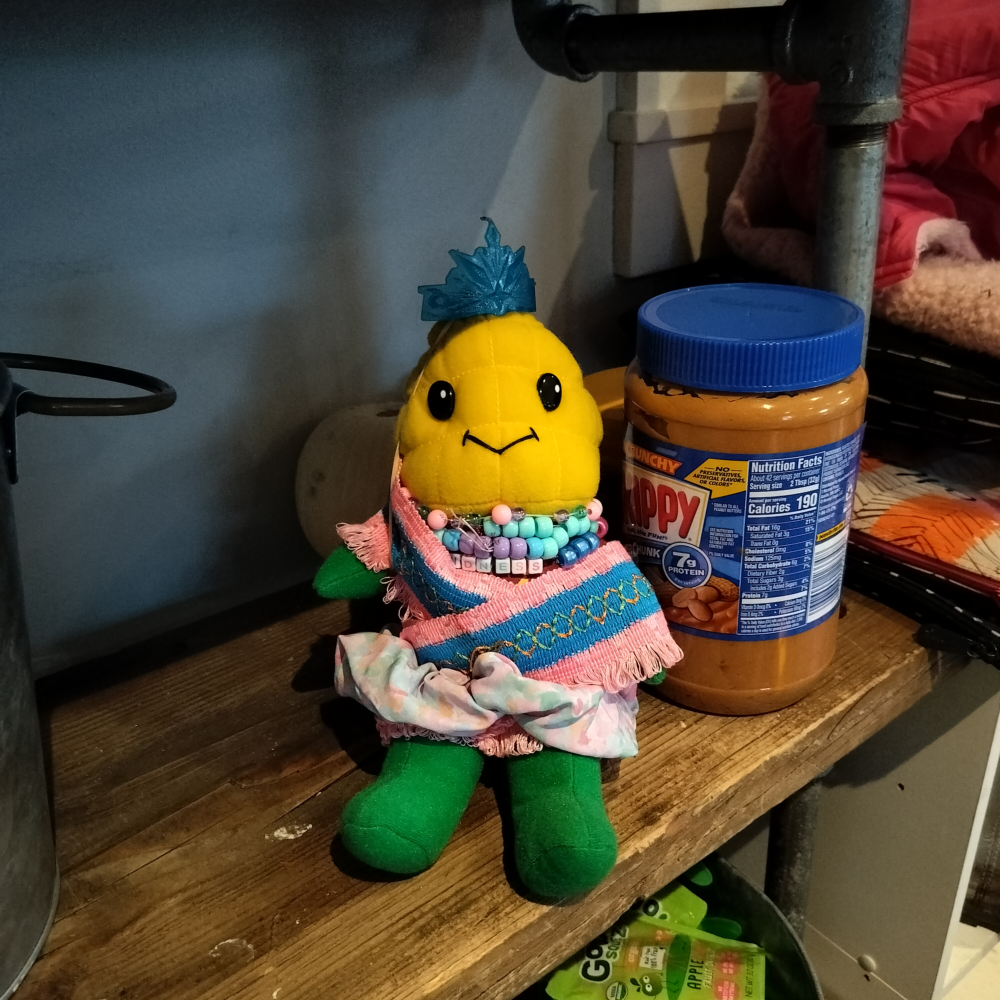

In [22]:
from PIL import Image, ImageOps
import os, sys

out_size = (224,224)
path = '../data_tanner_orig/niblet/'
out_path = '../data/niblet/niblet.gt.'
dirs = os.listdir(path)

im = Image.open(path+dirs[1])
print(im.size)
im

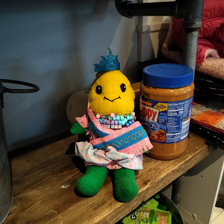

In [23]:
ImageOps.fit(im,out_size)

In [27]:
# This processes niblet images from the niblet/ folder

out_size = (224,224)
# update path to originals
path = '../data_tanner_orig/niblet/'
# update out_path to include your initials
out_path = '../data/niblet/niblet.gt.'
dirs = os.listdir(path)

file_num = 1

for item in dirs:
    if os.path.isfile(path+item):
        im = Image.open(path+item)
        imFit = ImageOps.fit(im,out_size)
        imFit.save(out_path + str(file_num).zfill(4)+'.jpeg')
        file_num += 1

In [28]:
# This processes not_niblet images from the not_niblet/ folder

out_size = (224,224)
# update path to originals
path = '../data_tanner_orig/not_niblet/'
# update out_path to include your initials
out_path = '../data/not_niblet/not_niblet.gt.'
dirs = os.listdir(path)

file_num = 1

for item in dirs:
    if os.path.isfile(path+item):
        im = Image.open(path+item)
        imFit = ImageOps.fit(im,out_size)
        imFit.save(out_path + str(file_num).zfill(4)+'.jpeg')
        file_num += 1

## Image Augmentation

We will end up with a little less than 2000 images once we have combined everyone's images. Unfortunately, this is pretty small scale relative to the number of parameters that we have in our problem. To get around this, we can "fatten" the data by including augmented versions of our images. This also has the benefit of preventing overfitting (learning the specifics of the training set instead of the patterns). We then generate augmented images on the fly to use as training examples.

Some common image augmentations:
- Geometric transformations: randomly flip, crop, rotate, stretch, and zoom images.
- Color space transformations: randomly change RGB color channels, contrast, and brightness.
- Kernel filters: randomly change the sharpness or blurring of the image.
- Random erasing: delete some part of the initial image.
- Mixing images: blending and mixing multiple images.

The good news is that tensorflow has many of the utilities that we need to do this automatically as part of the data pipeline. For more info, see: https://www.tensorflow.org/tutorials/images/data_augmentation

In [9]:
import tensorflow as tf

BATCH_SIZE = 4
SEED = 1

# This sets up a training and validation set from our ../data/ directory
train_dataset = tf.keras.utils.image_dataset_from_directory(
    '../data/',
    color_mode='rgb',
    batch_size=BATCH_SIZE,
    image_size=(224, 224),
    shuffle=True,
    validation_split=0.2,
    subset='training',
    seed=SEED)

val_dataset = tf.keras.utils.image_dataset_from_directory(
    '../data/',
    color_mode='rgb',
    batch_size=BATCH_SIZE,
    image_size=(224, 224),
    shuffle=False,
    validation_split=0.2,
    subset='validation',
    seed=SEED)

iterator = iter(train_dataset)

Found 83 files belonging to 2 classes.
Using 67 files for training.
Found 83 files belonging to 2 classes.
Using 16 files for validation.


In [10]:
from tensorflow.keras import layers

data_augmentation = tf.keras.Sequential([
  layers.RandomFlip("horizontal_and_vertical"),
  layers.RandomRotation(0.2),
])

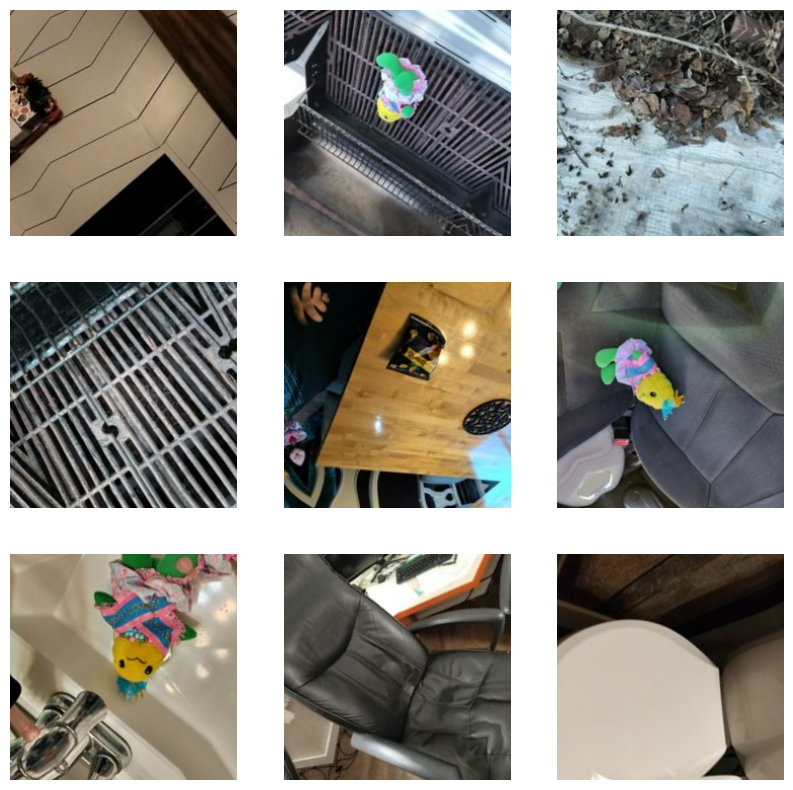

In [11]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for i in range(9):
  augmented_image = data_augmentation(next(iterator)[0][0])
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(augmented_image/255)
  plt.axis("off")
